# Olivetti Faces: Advanced Classification & Analysis
# Youssef BEN LETAIFA
## National Institute of Technology and Science of Kef
## tunisia
## youssef.benletaifa@intek.u-jendouba.tn
## www.linkedin.com/in/youssefbenletaifa-5b6078283
This notebook presents a professional workflow for face recognition using the Olivetti Faces dataset, leveraging modern machine learning best practices: data exploration, visualization, dimensionality reduction, model training, evaluation, and comparison. Each step is explained for clarity and reproducibility.

## 1. Imports & Setup

In [6]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold, LeaveOneOut
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_recall_curve, average_precision_score
from inspect import signature
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline

import os
import random

# For reproducibility
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

## 2. Data Loading & Exploration

In [8]:
# Load Olivetti Faces data
data = np.load(r"C:\Users\DELL\OneDrive\Desktop\Face Recognition on Olivetti Dataset\olivetti_faces.npy")
target = np.load(r"C:\Users\DELL\OneDrive\Desktop\Face Recognition on Olivetti Dataset\olivetti_faces_target.npy")

print(f"Number of images: {len(data)}")
print(f"Unique subjects: {len(np.unique(target))}")
print(f"Image shape: {data.shape[1]}x{data.shape[2]}")
print(f"Pixel range (first image): {data[0][0,:4]}")
print(f"Unique subject IDs: {np.unique(target)}")

Number of images: 400
Unique subjects: 40
Image shape: 64x64
Pixel range (first image): [0.30991736 0.3677686  0.41735536 0.44214877]
Unique subject IDs: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]


## 3. Visualization: Faces and Subjects

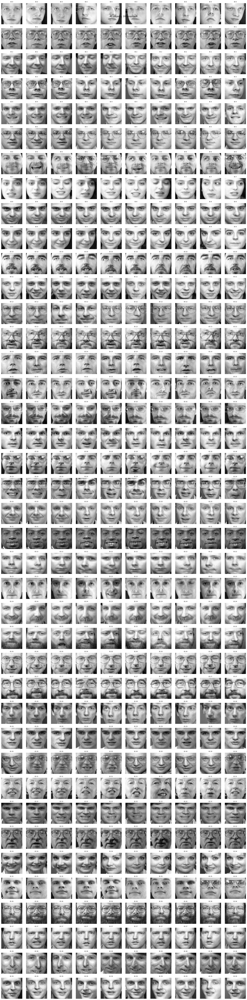

In [9]:
def show_faces(images, subject_ids, faces_per_subject=10):
    """Show all faces for the provided subject ids."""
    total_faces = len(subject_ids) * faces_per_subject
    cols = faces_per_subject
    rows = len(subject_ids)
    fig, axes = plt.subplots(rows, cols, figsize=(2*cols, 2*rows))
    axes = axes.flatten() if rows * cols > 1 else [axes]
    for i, subject_id in enumerate(subject_ids):
        for j in range(faces_per_subject):
            idx = subject_id * faces_per_subject + j
            ax = axes[i*cols + j]
            ax.imshow(images[idx], cmap='gray')
            ax.set_title(f"ID:{subject_id}", fontsize=8)
            ax.axis('off')
    plt.suptitle(f"{len(subject_ids)} subjects, {faces_per_subject} faces each")
    plt.tight_layout()
    plt.show()

show_faces(data, np.unique(target), faces_per_subject=10)

## 4. Data Preparation

In [10]:
# Flatten images for ML (samples, features)
X = data.reshape((data.shape[0], -1))
y = target.copy()

print("Feature matrix shape:", X.shape)

# Stratified split to preserve class balance
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=SEED
)

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

Feature matrix shape: (400, 4096)
Train shape: (280, 4096)
Test shape: (120, 4096)


## 5. Data Distribution Visualization

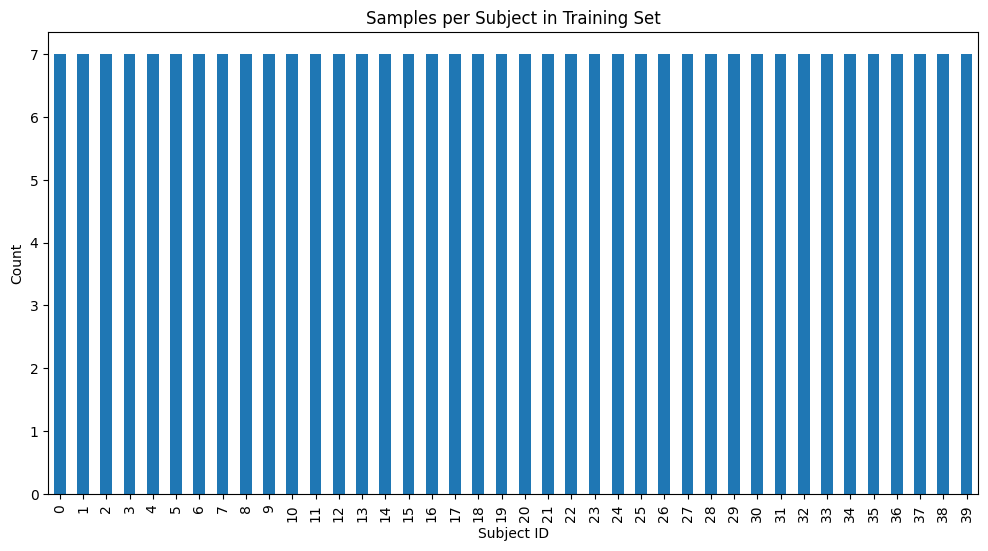

In [11]:
plt.figure(figsize=(12, 6))
pd.Series(y_train).value_counts().sort_index().plot(kind='bar')
plt.title("Samples per Subject in Training Set")
plt.xlabel("Subject ID")
plt.ylabel("Count")
plt.show()

## 6. PCA: Dimensionality Reduction & Visualization

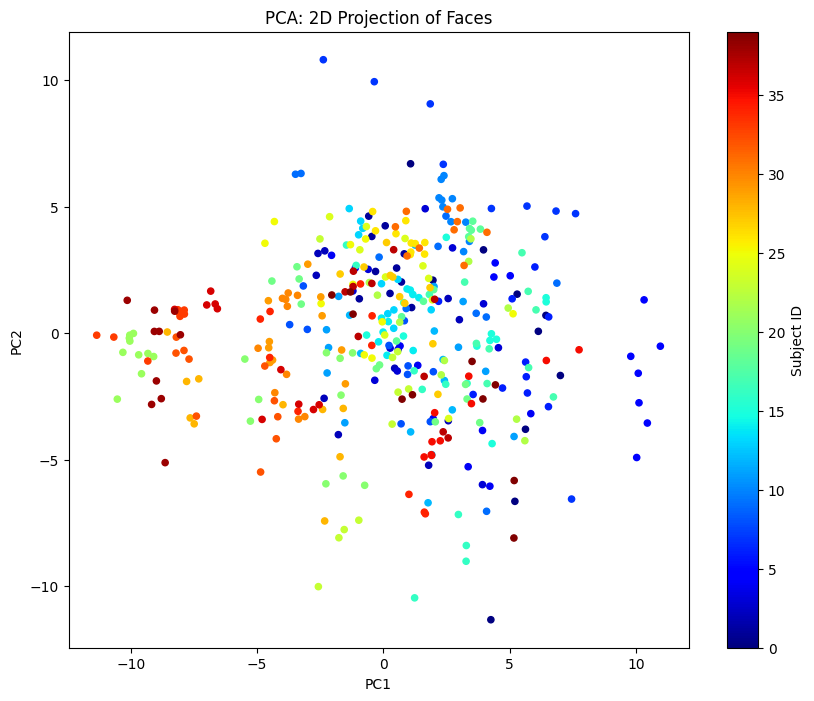

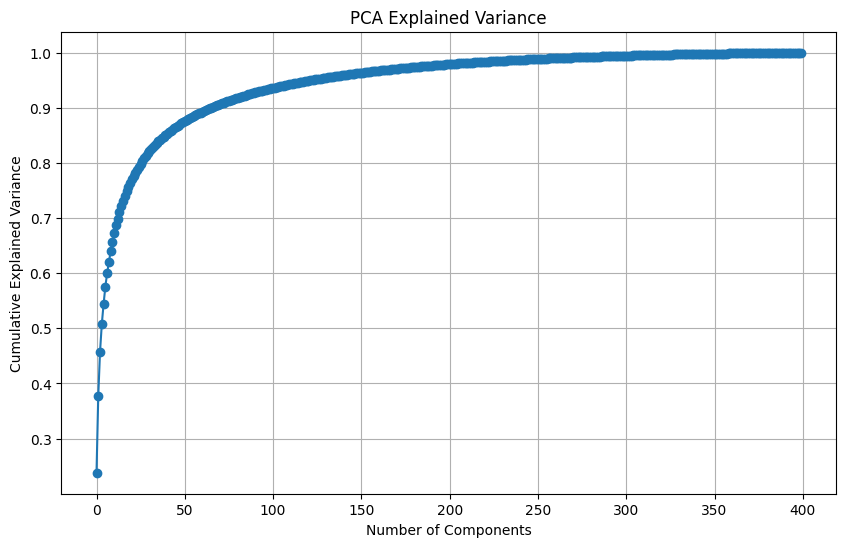

In [12]:
# Visualize with 2 principal components
pca_2d = PCA(n_components=2, random_state=SEED)
X_pca_2d = pca_2d.fit_transform(X)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=target, s=20, cmap='jet')
plt.colorbar(scatter, label="Subject ID")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("PCA: 2D Projection of Faces")
plt.show()

# Explained variance
pca_full = PCA(random_state=SEED)
pca_full.fit(X)
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca_full.explained_variance_ratio_), marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance")
plt.grid(True)
plt.show()

## 7. PCA: Eigenfaces Visualization

Number of PCA components for 95% variance: 123


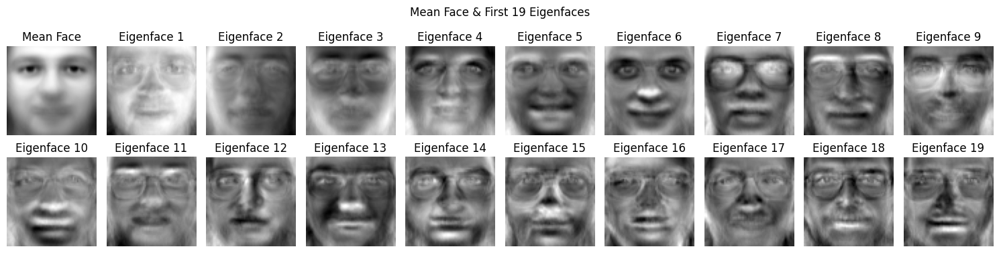

In [13]:
# Select number of components explaining ~95% variance
n_components = np.argmax(np.cumsum(pca_full.explained_variance_ratio_) > 0.95) + 1
print(f"Number of PCA components for 95% variance: {n_components}")

pca = PCA(n_components=n_components, whiten=True, random_state=SEED)
pca.fit(X_train)

# Visualize mean face & eigenfaces
fig, axes = plt.subplots(2, 10, figsize=(15, 4))
axes = axes.flatten()
axes[0].imshow(pca.mean_.reshape(data.shape[1], data.shape[2]), cmap='gray')
axes[0].set_title("Mean Face")
axes[0].axis('off')
for i in range(1, 20):
    axes[i].imshow(pca.components_[i-1].reshape(data.shape[1], data.shape[2]), cmap='gray')
    axes[i].set_title(f"Eigenface {i}")
    axes[i].axis('off')
plt.suptitle("Mean Face & First 19 Eigenfaces")
plt.tight_layout()
plt.show()

## 8. Model Training & Evaluation: Baseline & Advanced

Logistic Regression: Accuracy = 0.975
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      0.67      0.80         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      0.67      0.80         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00

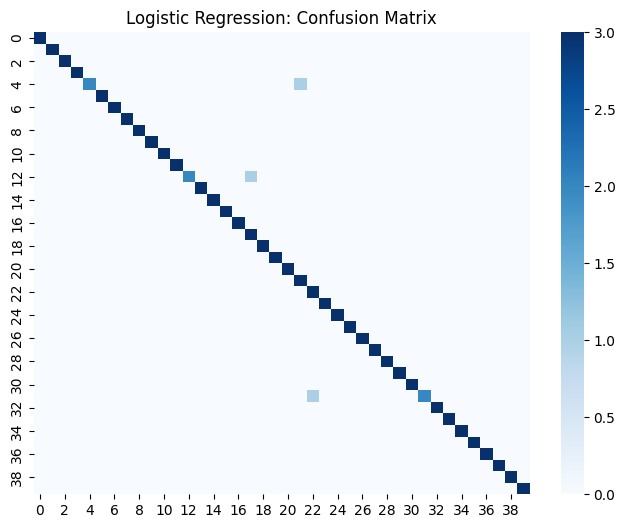

Linear Discriminant Analysis: Accuracy = 0.983
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      0.67      0.80         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      1.00      1.00         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00 

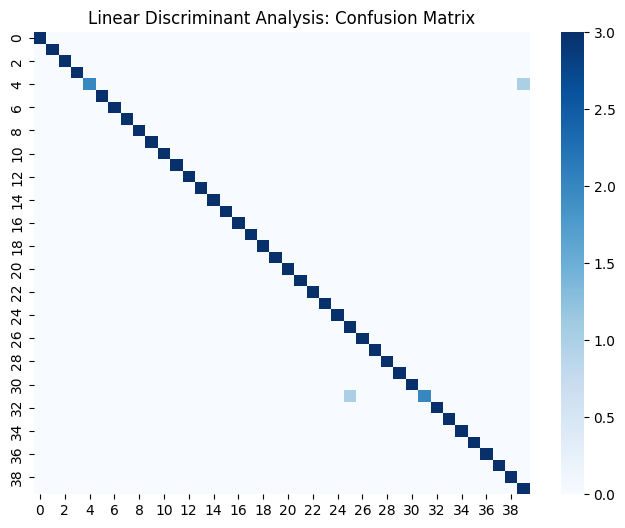

GaussianNB: Accuracy = 0.883
              precision    recall  f1-score   support

           0       0.50      1.00      0.67         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      0.67      0.80         3
           4       1.00      0.33      0.50         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       0.50      1.00      0.67         3
           8       1.00      1.00      1.00         3
           9       1.00      0.67      0.80         3
          10       1.00      0.67      0.80         3
          11       0.60      1.00      0.75         3
          12       1.00      1.00      1.00         3
          13       1.00      0.67      0.80         3
          14       1.00      1.00      1.00         3
          15       0.25      0.33      0.29         3
          16       0.75      1.00      0.86         

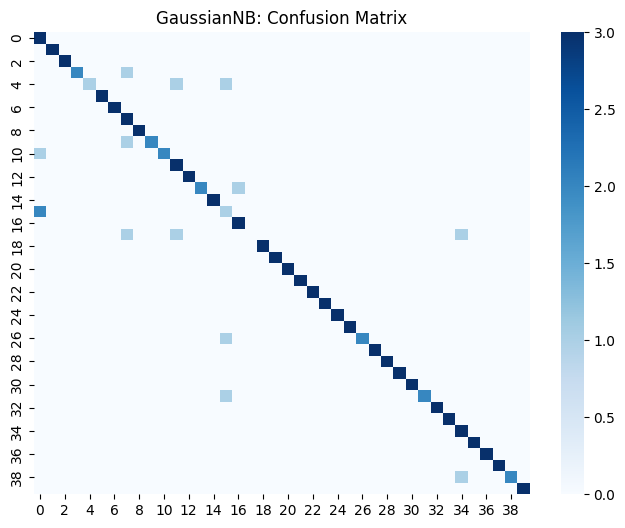

KNeighbors: Accuracy = 0.608
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       1.00      0.33      0.50         3
           2       0.67      0.67      0.67         3
           3       0.50      0.33      0.40         3
           4       0.43      1.00      0.60         3
           5       0.43      1.00      0.60         3
           6       1.00      0.67      0.80         3
           7       1.00      0.33      0.50         3
           8       0.75      1.00      0.86         3
           9       1.00      0.33      0.50         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      0.33      0.50         3
          13       1.00      1.00      1.00         3
          14       0.20      1.00      0.33         3
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00         

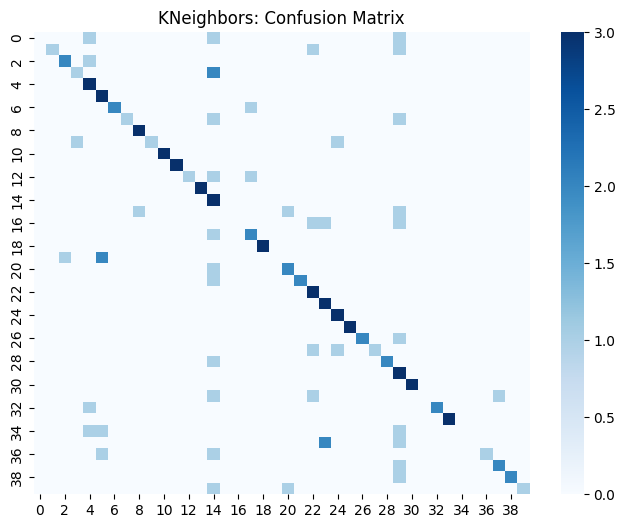

Decision Tree: Accuracy = 0.533
              precision    recall  f1-score   support

           0       0.25      0.33      0.29         3
           1       0.40      0.67      0.50         3
           2       0.33      0.33      0.33         3
           3       0.25      0.33      0.29         3
           4       1.00      0.33      0.50         3
           5       1.00      1.00      1.00         3
           6       0.00      0.00      0.00         3
           7       0.25      0.33      0.29         3
           8       0.33      0.67      0.44         3
           9       1.00      0.33      0.50         3
          10       1.00      1.00      1.00         3
          11       0.60      1.00      0.75         3
          12       1.00      0.33      0.50         3
          13       1.00      0.33      0.50         3
          14       0.50      0.67      0.57         3
          15       0.00      0.00      0.00         3
          16       0.00      0.00      0.00      

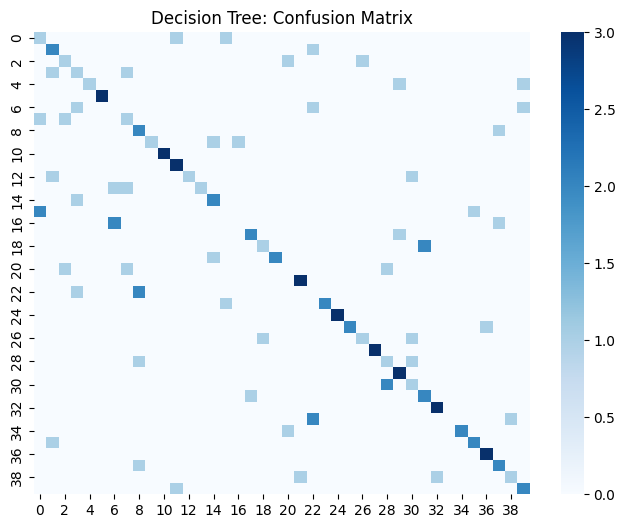

SVM (Linear): Accuracy = 0.975
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      0.67      0.80         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      0.67      0.80         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00       

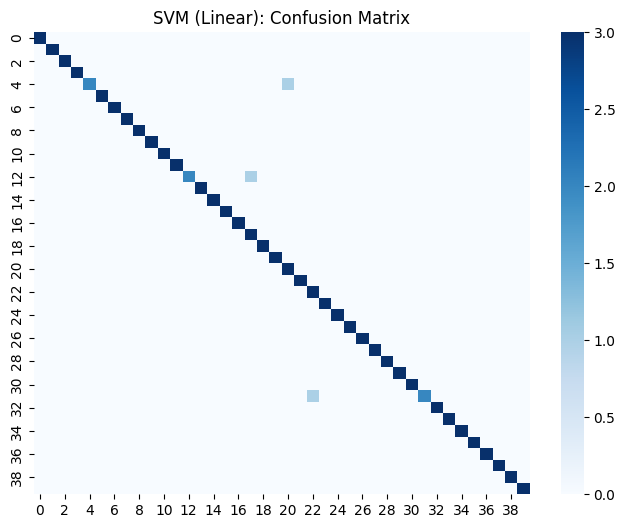

SVM (RBF): Accuracy = 0.975
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      0.67      0.80         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       1.00      0.67      0.80         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       0.75      1.00      0.86         3
          16       1.00      1.00      1.00         3

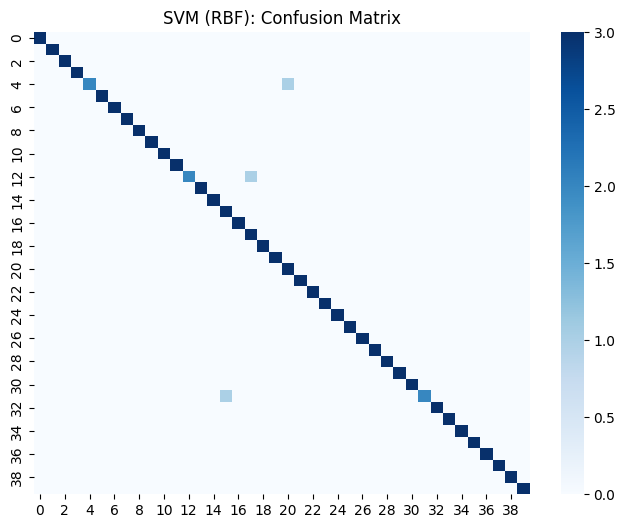

In [14]:
# Transform features
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

# Define models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=SEED),
    "Linear Discriminant Analysis": LinearDiscriminantAnalysis(),
    "GaussianNB": GaussianNB(),
    "KNeighbors": KNeighborsClassifier(n_neighbors=5),
    "Decision Tree": DecisionTreeClassifier(random_state=SEED),
    "SVM (Linear)": SVC(kernel="linear", probability=True, random_state=SEED),
    "SVM (RBF)": SVC(kernel="rbf", probability=True, random_state=SEED)
}

results = {}
for name, model in models.items():
    model.fit(X_train_pca, y_train)
    y_pred = model.predict(X_test_pca)
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc
    print(f"{name}: Accuracy = {acc:.3f}")
    print(classification_report(y_test, y_pred, zero_division=0))
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=False, cmap='Blues')
    plt.title(f"{name}: Confusion Matrix")
    plt.show()

## 9. Cross-Validation & Model Comparison

Logistic Regression: Mean CV Accuracy = 0.905
Linear Discriminant Analysis: Mean CV Accuracy = 0.972
GaussianNB: Mean CV Accuracy = 0.682
KNeighbors: Mean CV Accuracy = 0.595
Decision Tree: Mean CV Accuracy = 0.408
SVM (Linear): Mean CV Accuracy = 0.895
SVM (RBF): Mean CV Accuracy = 0.790


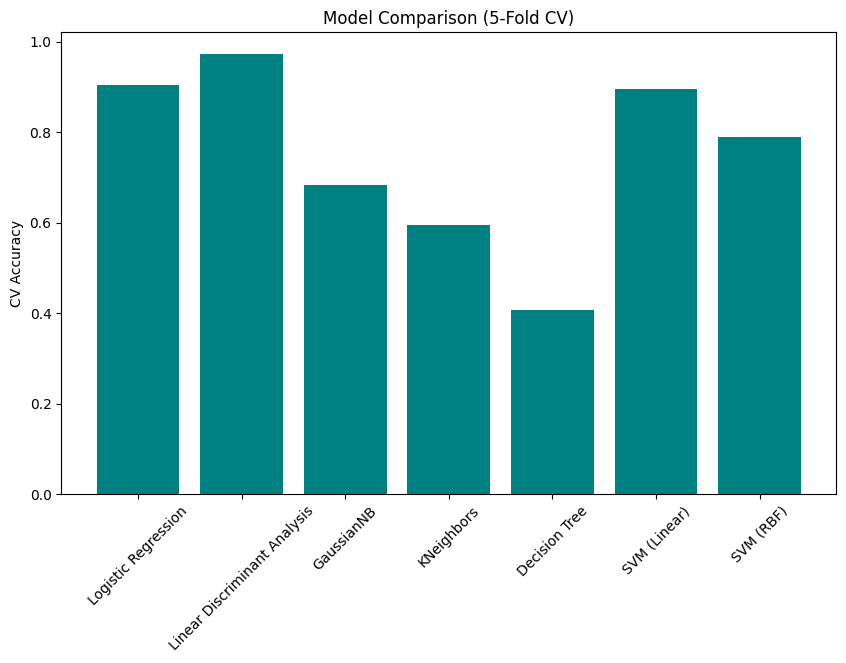

In [15]:
# KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=SEED)
cv_results = {}
for name, model in models.items():
    scores = cross_val_score(model, pca.transform(X), target, cv=kf)
    cv_results[name] = scores.mean()
    print(f"{name}: Mean CV Accuracy = {scores.mean():.3f}")

# Plot comparison
plt.figure(figsize=(10, 6))
plt.bar(cv_results.keys(), cv_results.values(), color='teal')
plt.ylabel("CV Accuracy")
plt.title("Model Comparison (5-Fold CV)")
plt.xticks(rotation=45)
plt.show()

## 10. Hyperparameter Tuning: SVM

In [16]:
param_grid = {
    'C': np.logspace(-2, 2, 5),
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}
grid = GridSearchCV(SVC(probability=True, random_state=SEED), param_grid, cv=kf, n_jobs=-1)
grid.fit(X_train_pca, y_train)
print("Best SVM parameters:", grid.best_params_)
print("Best SVM CV score:", grid.best_score_)
svm_best = grid.best_estimator_
y_pred = svm_best.predict(X_test_pca)
print("SVM Test Accuracy:", accuracy_score(y_test, y_pred))

Best SVM parameters: {'C': np.float64(0.1), 'gamma': 'scale', 'kernel': 'linear'}
Best SVM CV score: 0.7928571428571428
SVM Test Accuracy: 0.975


## 11. Multi-Class Precision-Recall Analysis

C:\Users\DELL\anaconda3\envs\Hand_gesture\Lib\site-packages\sklearn\metrics\_ranking.py:1046: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\DELL\anaconda3\envs\Hand_gesture\Lib\site-packages\sklearn\metrics\_ranking.py:1046: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


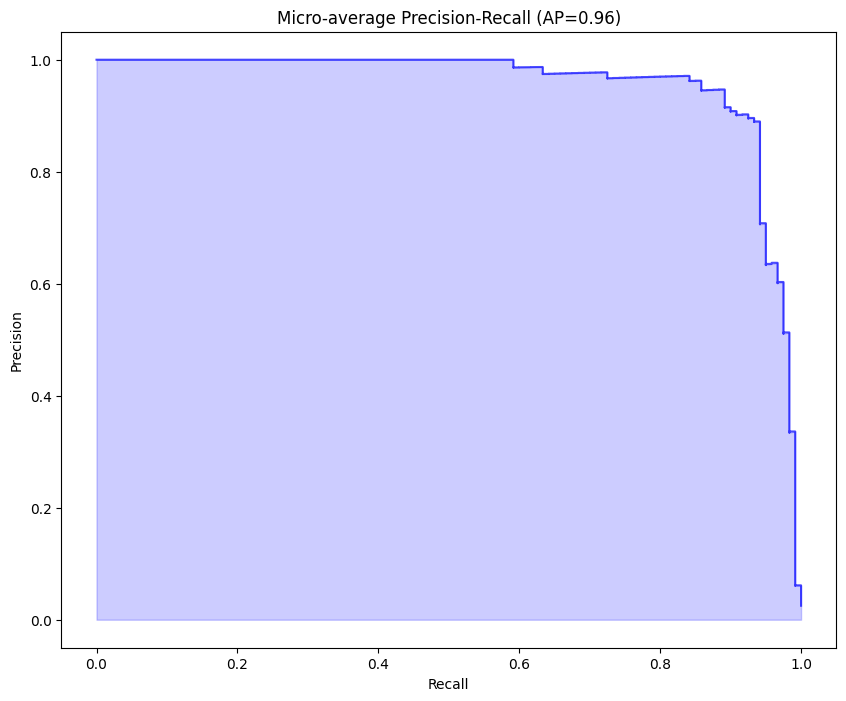

In [17]:
# Binarize targets for multi-class PR curve
y_bin = label_binarize(target, classes=np.unique(target))
X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(X, y_bin, test_size=0.3, random_state=SEED)

pca = PCA(n_components=n_components, whiten=True, random_state=SEED)
pca.fit(X_train_bin)
X_train_bin_pca = pca.transform(X_train_bin)
X_test_bin_pca = pca.transform(X_test_bin)

clf = OneVsRestClassifier(LogisticRegression(max_iter=1000, random_state=SEED))
clf.fit(X_train_bin_pca, y_train_bin)
y_score = clf.decision_function(X_test_bin_pca)

precision = dict()
recall = dict()
average_precision = dict()
for i in range(y_bin.shape[1]):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
    average_precision[i] = average_precision_score(y_test_bin[:, i], y_score[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(y_test_bin.ravel(), y_score.ravel())
average_precision["micro"] = average_precision_score(y_test_bin, y_score, average="micro")

plt.figure(figsize=(10, 8))
plt.step(recall['micro'], precision['micro'], where='post', color='b', alpha=0.7)
plt.fill_between(recall["micro"], precision["micro"], alpha=0.2, color='b')
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(f'Micro-average Precision-Recall (AP={average_precision["micro"]:.2f})')
plt.show()

## 12. Pipeline Example: LDA + Logistic Regression

In [19]:
# Calculate max valid components for LDA
n_features = X_train.shape[1]
n_classes = len(np.unique(y_train))
max_lda_components = min(n_features, n_classes - 1)

# Now use it safely
pipeline = Pipeline([
    ('lda', LinearDiscriminantAnalysis(n_components=max_lda_components)),
    ('lr', LogisticRegression(max_iter=1000, random_state=SEED))
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

print("Pipeline (LDA + LR) Test Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, zero_division=0))


Pipeline (LDA + LR) Test Accuracy: 0.975
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
           3       1.00      1.00      1.00         3
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         3
           6       1.00      0.67      0.80         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      0.67      0.80         3
          10       1.00      1.00      1.00         3
          11       1.00      1.00      1.00         3
          12       0.75      1.00      0.86         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1